## 12.17_프로젝트: CAM을 만들고 평가해 보자


### 2가지 실험 진행을 계획하였으나, 데이터를 옮기는 과정에서 시간이 많이 소요되는 문제.  
=> RSNA penumonia detection만 진행
1. Diabetic Retinopathy Detection 당뇨병성 망막병증  
2. RSNA penumonia detection

- 서버 구축이 된다면, 다시 하단 실험을 추후 진행해보고 싶습니다.
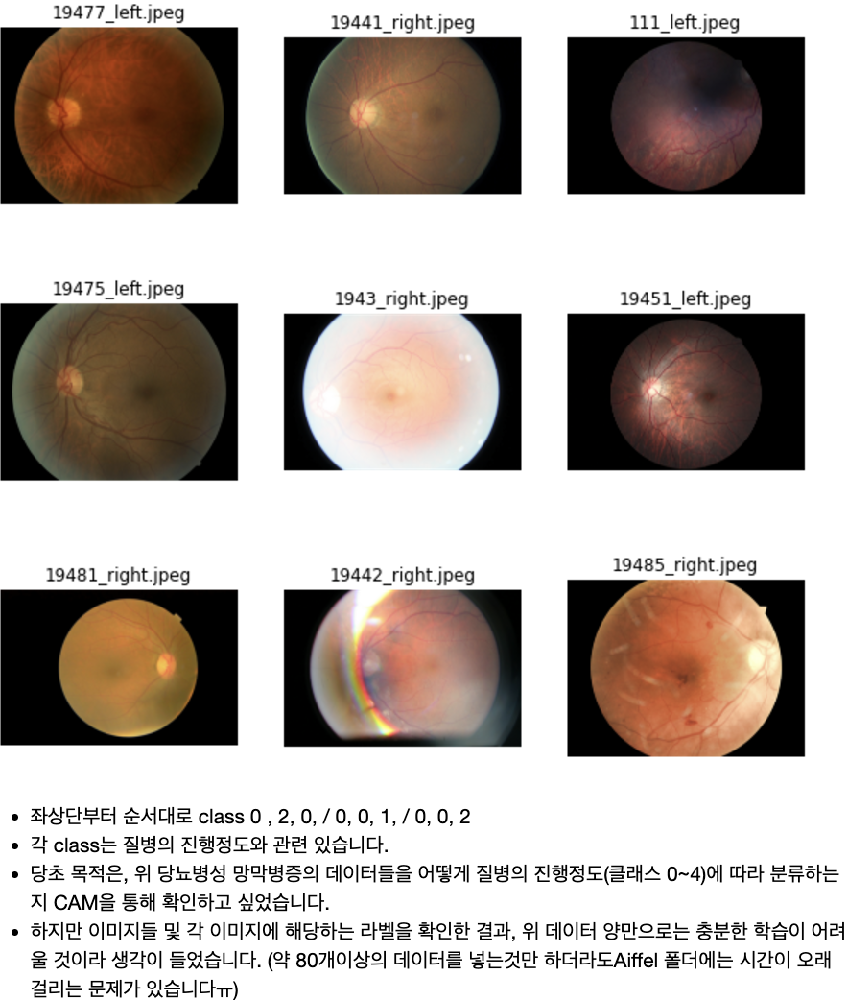


실험 데이터는, 2018년 북미영상의학회가 주최한  'RSNA Pneumonia Detection Challenge' 데이터를 기반으로 하였고, claasification fine tuning model은 이 대회에 참가한 '
Dmitry Sirenchenko' 참가자의 모델을 인용하였습니다.  
대회 주소 : https://www.kaggle.com/competitions/rsna-pneumonia-detection-challenge/overview  
인용 모델 : https://www.kaggle.com/code/dmitrysirenchenko/pneumonia-classification-fine-tuning-resnet-83-3/notebook




여기서 저는, fine tuning model의 끝단 conv layer를 활용하여 'CAM'을 추출하였습니다. 이후 끝단 뿐만 아니라 저차원부터 고차원의 특성맵을 활용한 'Grad_CAM'을 추출한 뒤 비교실험을 진행하였습니다.  
실제 ground truth bbox를 만들 수 있는 데이터 또한 csv속에 담겨있음을 알고 위 데이터를 선택하였으나, 막상 프로젝트를 진행할때 DICOM 파일을 전처리 하는과정에서 저의 실수 및 문제가 있었습니다. 결과적으로 iou계산은 추가실험으로 진행하고자 합니다. (데이터 전처리 과정에서부터 이를 고려하지 않고 진행하여, DICOM파일을 전처리하는 처음과정부터 다시 진행해야 할 것 같습니다.)  
자세한 설명은 하단 전처리 과정에서 설명하겠습니다.

In [1]:
# prompt: goggle drive mount

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


### 1. 데이터셋 구성 및 전처리
환자들의 영상사진은 'DICOM'이라는 파일로 저장되어 있어, 이를 jpg 이미지로 변환하는 과정이 필요합니다.

In [8]:
# prompt: /content/drive/MyDrive/Colab_Notebooks_JD_result/GoingDeeper_CV/12.07_GD3_CAM/rsna-pneumonia-detection-challenge.zip -> zip파일 해제

from google.colab import drive
import zipfile

zip_file_path = '/content/drive/MyDrive/Colab_Notebooks_JD_result/GoingDeeper_CV/12.07_GD3_CAM/rsna-pneumonia-detection-challenge.zip'
extract_path = '/content/rsna-pneumonia-detection-challenge'  # Specify the extraction directory

try:
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print(f"Successfully extracted {zip_file_path} to {extract_path}")
except FileNotFoundError:
    print(f"Error: File not found at {zip_file_path}")
except zipfile.BadZipFile:
    print(f"Error: Invalid zip file at {zip_file_path}")
except Exception as e:
    print(f"An unexpected error occurred: {e}")

Successfully extracted /content/drive/MyDrive/Colab_Notebooks_JD_result/GoingDeeper_CV/12.07_GD3_CAM/rsna-pneumonia-detection-challenge.zip to /content/rsna-pneumonia-detection-challenge


In [6]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pydicom as dcm
from pathlib import Path
import os
from tqdm.notebook import tqdm
import cv2
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.layers import Layer, Convolution2D, Dense, RandomRotation, RandomFlip, Resizing, Rescaling
from tensorflow.keras.layers import Concatenate, UpSampling2D, Conv2D, Reshape, GlobalAveragePooling2D, GlobalMaxPooling2D
from tensorflow.keras.layers import Dense, Activation, Flatten, Dropout, MaxPooling2D, BatchNormalization
from tensorflow.keras.layers import Input, ReLU, AveragePooling2D, Activation, Flatten
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras import losses, optimizers
from keras import backend as K
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [5]:
!pip install pydicom

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 37.1 MB/s eta 0:00:00


In [9]:
train_class = pd.read_csv('/content/rsna-pneumonia-detection-challenge/stage_2_detailed_class_info.csv')
train_labels = pd.read_csv('/content/rsna-pneumonia-detection-challenge/stage_2_train_labels.csv')
train_path = Path('/content/rsna-pneumonia-detection-challenge/stage_2_train_images')

test_path = Path('/content/rsna-pneumonia-detection-challenge/stage_2_test_images')
train_meta = pd.concat([train_labels, train_class.drop(columns=['patientId'])], axis=1)

In [10]:
#  DICOM 파일을 JPG 이미지로 저장하기
def save_img_from_dcm(dcm_dir, img_dir, patient_id):
    # dcm_dir : DICOM 파일 위치 / img_dir : 변환된 jpg이미지 저장 / 환자ID로 파일이름 생성
    img_fp = os.path.join(img_dir, "{}.jpg".format(patient_id))
    if os.path.exists(img_fp):
        return # os.path.exists를 사용하여 JPG 이미지 파일이 이미 존재하는지 확인합니다. 이미 존재하면 함수는 더 이상 진행하지 않고 return 문을 통해 종료
    dcm_fp = os.path.join(dcm_dir, "{}.dcm".format(patient_id)) # os.path.join을 사용하여 DICOM 파일의 경로 (dcm_fp)를 생성합니다. 파일 이름은 환자 ID를 사용하여 "{}.dcm" 형식으로 지정
    img_1ch = pydicom.dcmread(dcm_fp).pixel_array # pydicom.read_file을 사용하여 DICOM 파일을 읽고 이미지 데이터를 img_1ch 변수에 저장합니다. 이 데이터는 일반적으로 흑백 이미지
    img_3ch = np.stack([img_1ch]*3, -1) # np.stack을 사용하여 흑백 이미지 데이터 (img_1ch)를 3번 복사하여 3채널 컬러 이미지 (img_3ch)로 변환합니다. JPG 형식은 컬러 이미지를 저장하기 때문에 이 변환이 필요

    img_fp = os.path.join(img_dir, "{}.jpg".format(patient_id))
    cv2.imwrite(img_fp, img_3ch) # cv2.imwrite을 사용하여 컬러 이미지 데이터 (img_3ch)를 JPG 파일로 저장합니다. 파일 경로는 img_fp에 지정된 경로를 사용

In [11]:
def get_image(dcm_file): # 다이콤 파일 -> 이미지 변환
    ADJUSTED_IMAGE_SIZE = 128
    dcm_data = dcm.dcmread(dcm_file)
    img = dcm_data.pixel_array
    img = np.stack((img,) * 3, -1)

    img = np.array(img).astype(np.uint8)
    res = cv2.resize(img,(ADJUSTED_IMAGE_SIZE,ADJUSTED_IMAGE_SIZE), interpolation = cv2.INTER_LINEAR)
    return res

def read_train(rowData): # 훈련 데이터셋을 읽어들여 이미지 리스트를 생성하고, NumPy 배열로 변환하여 반환
    imageList = []
    for index, row in tqdm(rowData.iterrows()): # tqdm: 진행상황 표시 bar, rowData.iterrows의 Iterate(각행을 하나씩 꺼내줌) 순회
        patientId = row.patientId # 현재 행 (row)에서 patientId 열의 값을 추출하여 patientId 변수에 저장
        dcm_file = '/content/rsna-pneumonia-detection-challenge/stage_2_train_images/'+'{}.dcm'.format(patientId)
        imageList.append(get_image(dcm_file))

    return np.array(imageList)

def read_test(path):
    imageList = []
    for file_name in tqdm(os.listdir(path)):
        dcm_file = dcm_file = os.sep.join([path, file_name])
        imageList.append(get_image(dcm_file))
    return np.array(imageList)

test_images_path = '/content/rsna-pneumonia-detection-challenge/stage_2_test_images'
test_images = read_test(test_images_path)

train_images = read_train(train_labels)
# train_labels -> rawData -> 각 행을 (index, row) 쌍으로 반환하는 iterator를 생성, 환자id생성 -> 이를 이용 dicom파일 이미지 처리
print(train_images.shape)


  0%|          | 0/3000 [00:00<?, ?it/s]

0it [00:00, ?it/s]

(30227, 128, 128, 3)


모든 실험을 마친 뒤, 돌이켜 볼때 위 read_train 과정에서 오로지 imageList만을 가져온 것이 문제였습니다. csv를 들여다보면 bbox에 대한 x, y , width, height가 각 환자별로 작성되어 있었고, 위 DICOM파일을 가져올때 함께 위 정보를 가져왔어야 했으나, 이를 간과하였습니다.  
이는 추후, CAM의 바탕이 되는 환자의 영상에 대한 정보를 재추적 할 수 없는 상황이 되어, ground truth bbox에 대한 정보를 찾을 수 없는 문제가 됐습니다.  
-> 전처리를 할 땐 데이터 탐색부터... 반성

#### 데이터 셋 *확인*

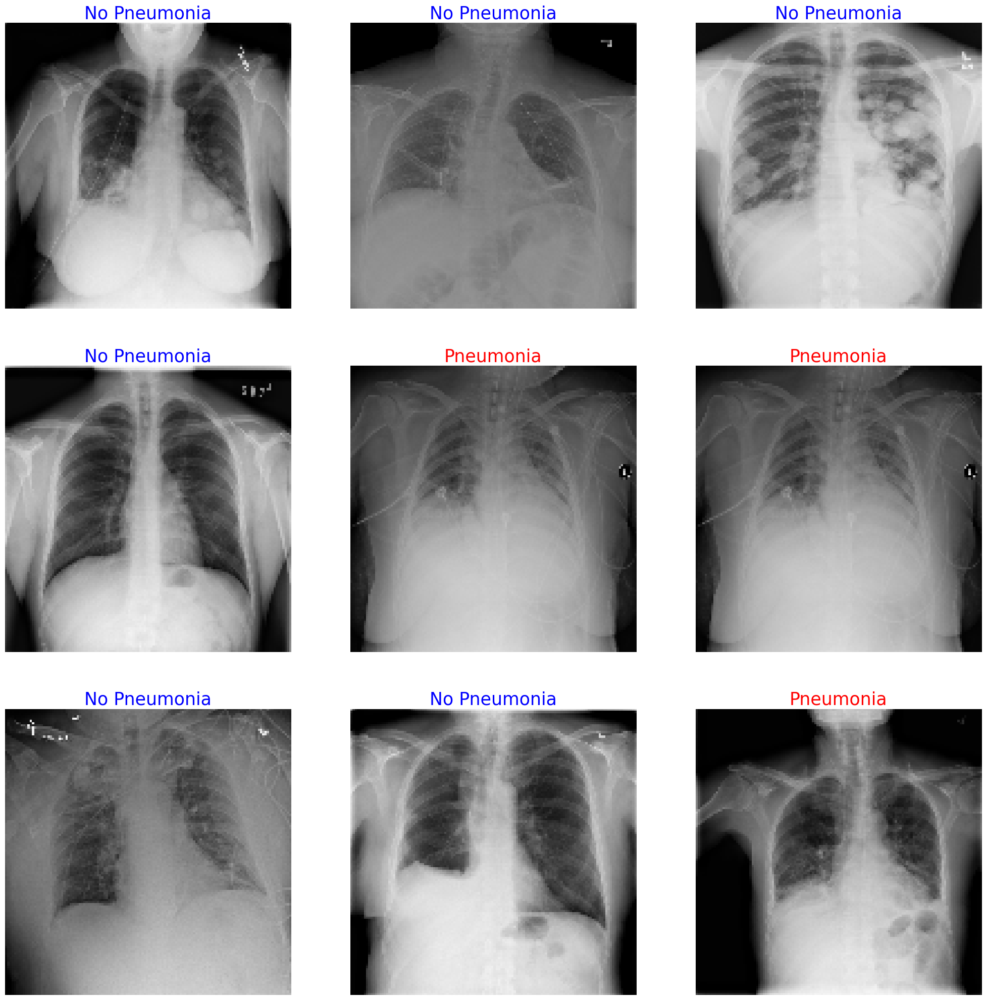

In [ ]:
plt.figure(figsize=(25,25))
for i, image in enumerate(train_images[:9]):

    plt.subplot(3,3,i+1) # i+1번째 subplot선택
    plt.imshow(image)
    if train_labels.loc[i]["Target"]: # train_labels dF i행의 Target열 값 확인: 1(폐렴일시)
        plt.title("Pneumonia", color="red", fontsize=25)
    else:
        plt.title("No Pneumonia", color="blue", fontsize=25)
    plt.axis('off')
plt.show()

# df.loc[행_레이블, 열_레이블] : 레이블 (행 이름, 열 이름)을 기반으로 데이터를 선택할 때 유용하게 사용

각 환자별 폐렴인지, 정상인지에 대해 영상과 함께 라벨을 확인할 수 있습니다.
제가 활용한 데이터는 총 30227개의 영상데이터 입니다.


#### train, val data 분리

In [ ]:
y = pd.get_dummies(train_labels["Target"]).values # Target 0,1 을 원핫 인코딩 -> .values는 one-hot encoding으로 변환된 결과를 NumPy 배열 형태로 변환
random_state = 42

X_train, X_test, y_train, y_test = train_test_split(train_images, y, test_size=0.2, random_state=random_state)
# Tarin, Validation split
# train X y 훈련(데이터, 라벨) / test X y 테스트데이터('')

In [ ]:
# 자체 평가지표
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

### 2. VGG16 fine tuning model을 활용한 CAM 모델 구성 및 학습, 적용

In [ ]:
# Fine tuning model 활용
# VGG16 base model
base_model = tf.keras.applications.VGG16(
    weights = 'imagenet',
    include_top = False) # VGG 마지막 Dense Layer만 제거

base_model.trainable = True # VGG16 모델 가중치 새로운 데이터에 맞춰 학습 가능!
for layer in base_model.layers:
    if isinstance(layer, BatchNormalization): # set BatchNorm layers as not trainable
        layer.trainable = False
        # BatchNormalization 레이어는 fine-tuning 과정에서 불안정성을 야기할 수 있으므로, 학습하지 않도록 고정하는 것이 일반적

# Data Augmentation Step -> 환자 사진중 회전된 사진이 있었음
augment = Sequential([
#   RandomFlip("horizontal"),
#     Rescaling(1./255), # pretrained model already include rescaling
    RandomRotation(0.15)
], name='AugmentationLayer')

ADJUSTED_IMAGE_SIZE = 128
input_shape = (ADJUSTED_IMAGE_SIZE, ADJUSTED_IMAGE_SIZE, 3)
num_classes = y_train.shape[1]

inputs = Input(shape = input_shape, name='inputLayer')
x = augment(inputs)
pretrain_out = base_model(x, training = False)
x = Flatten()(pretrain_out)
x = Dense(64, activation='relu')(x) # 비선형성 한번 더 추가
x = Dense(y_train.shape[1], name='outputLayer')(x) # 분류할 클래스 개수만큼 뉴런수 정의
outputs = Activation(activation="softmax", dtype=tf.float32, name='activationLayer')(x)
model = Model(inputs=inputs, outputs=outputs, name='fine_tunned_model')
# activationLayer = pred

In [ ]:
model.summary()

Model: "fine_tunned_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inputLayer (InputLayer)              │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ AugmentationLayer (Sequential)       │ (None, 128, 128, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ vgg16 (Functional)                   │ (None, 4, 4, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │         524,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ outputLayer (Dense)                  │ (None, 2)                   │             130 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activationLayer (Activation)         │ (None, 2)                   │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 15,239,170 (58.13 MB)

 Trainable params: 15,239,170 (58.13 MB)

 Non-trainable params: 0 (0.00 B)

VGG16 하단 Dense Layer만 제거한 뒤, Dense Layer를 추가하여 원하는 분류를 할 수 있게끔 fine tuning 한 모델입니다.
환자의 영상 사진중 일부가 회전된(영상촬영 시 몸을 움직이는 등의 문제로) 영상이 있어, 이를 다루기 위한 AugmentationLayer가 추가로 구성되 있습니다.
base model의 학습 가중치 또한 새롭게 trainable할 수있도록 설정하였습니다.

In [ ]:
# include_top=True (기본값)
# include_top=False
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import ResNet50

base_model2_forcheck = VGG16(include_top=False)
print(base_model2_forcheck.layers[-1].name)  # 출력: block5_pool
print(base_model2_forcheck.layers[-2].name) # block5_conv3
print(base_model2_forcheck.layers[-3].name) # block5_conv2

base_model3_forcheck = ResNet50(include_top=False)
print(base_model3_forcheck.layers[-1].name) # conv5_block3_out
print(base_model3_forcheck.layers[-2].name) # conv5_block3_add

block5_pool
block5_conv3
block5_conv2
conv5_block3_out
conv5_block3_add


모델 summary에는 vgg16 전체가 들어가 있어, VGG16의 하단 레이어 구성을 확인하였습니다.

In [ ]:
model.compile(optimizer=AdamW(learning_rate=0.00001),
                   loss=losses.categorical_crossentropy,
                   metrics=['accuracy']) # ,f1_m

history = model.fit(X_train, y_train, # 훈련데이터, 훈련라벨
                         batch_size=16,
                         epochs=15,
                         validation_data=(X_test, y_test), # 테스트 데이터, 테스트라벨
                         callbacks=[
                             EarlyStopping(monitor = "val_loss", patience = 7,
                                           restore_best_weights = True, mode='min'),
                             ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min') # ReduceLROnPlateau: 검증 손실이 개선되지 않으면 학습률을 감소시킵니다. 0.2배
                             # patience=2는 2번의 epoch 동안 검증 손실이 개선되지 않으면 학습률을 감소
                    ]
                        )


Epoch 1/15
1512/1512 ━━━━━━━━━━━━━━━━━━━━ 170s 106ms/step - accuracy: 0.7305 - loss: 0.8628 - val_accuracy: 0.8108 - val_loss: 0.4201 - learning_rate: 1.0000e-05
Epoch 2/15
1512/1512 ━━━━━━━━━━━━━━━━━━━━ 168s 111ms/step - accuracy: 0.8096 - loss: 0.4147 - val_accuracy: 0.8103 - val_loss: 0.4245 - learning_rate: 1.0000e-05
Epoch 3/15
1512/1512 ━━━━━━━━━━━━━━━━━━━━ 194s 105ms/step - accuracy: 0.8147 - loss: 0.4033 - val_accuracy: 0.8159 - val_loss: 0.4067 - learning_rate: 1.0000e-05
Epoch 4/15
1512/1512 ━━━━━━━━━━━━━━━━━━━━ 200s 104ms/step - accuracy: 0.8184 - loss: 0.3987 - val_accuracy: 0.7987 - val_loss: 0.4217 - learning_rate: 1.0000e-05
Epoch 5/15
1512/1512 ━━━━━━━━━━━━━━━━━━━━ 201s 104ms/step - accuracy: 0.8215 - loss: 0.3869 - val_accuracy: 0.8114 - val_loss: 0.4118 - learning_rate: 1.0000e-05
Epoch 6/15
1512/1512 ━━━━━━━━━━━━━━━━━━━━ 202s 104ms/step - accuracy: 0.8272 - loss: 0.3744 - val_accuracy: 0.8272 - val_loss: 0.3813 - learning_rate: 2.0000e-06
Epoch 7/15
1512/1512 ━━━━━━━

폐렴 진단에 맞는 학습 가중치를 새롭게 업데이트 하기 위해, 15에폭 학습을 진행하였습니다.  
val_accuracy: 0.8334 - val_loss: 0.3793  
위 실험은 모델 성능을 높이는 것이 목적이 아니므로, 위 성능에 만족하고 다음을 진행

In [ ]:
# # 모델 및 히스토리 저장
# save_dir = '/content/drive/MyDrive/Colab_Notebooks_JD_result/GoingDeeper_CV/12.07_GD3_CAM'

# model_path = os.path.join(save_dir, "fine_tuned_vgg16_model.keras")
# model.save(model_path)
# print(f"Model saved at {model_path}")

# import pickle

# # History 저장
# history_path = os.path.join(save_dir, "fine_tuned_training_history.pkl")
# with open(history_path, "wb") as f:
#     pickle.dump(history.history, f)
# print(f"Training history saved at {history_path}")

from tensorflow.keras.models import load_model
import pickle

# 모델 불러오기
loaded_model = load_model(model_path)
print("Model loaded successfully.")

# History 불러오기
with open(history_path, "rb") as f:
    loaded_history = pickle.load(f)
print("Training history loaded successfully.")

# 확인: 학습 과정 시각화
import matplotlib.pyplot as plt

plt.plot(loaded_history['accuracy'], label='Train Accuracy')
plt.plot(loaded_history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

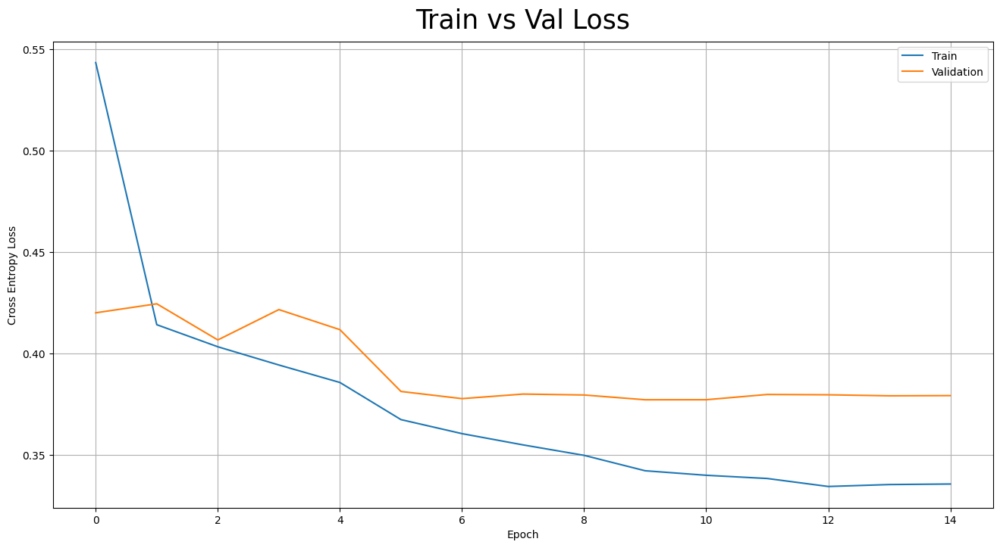

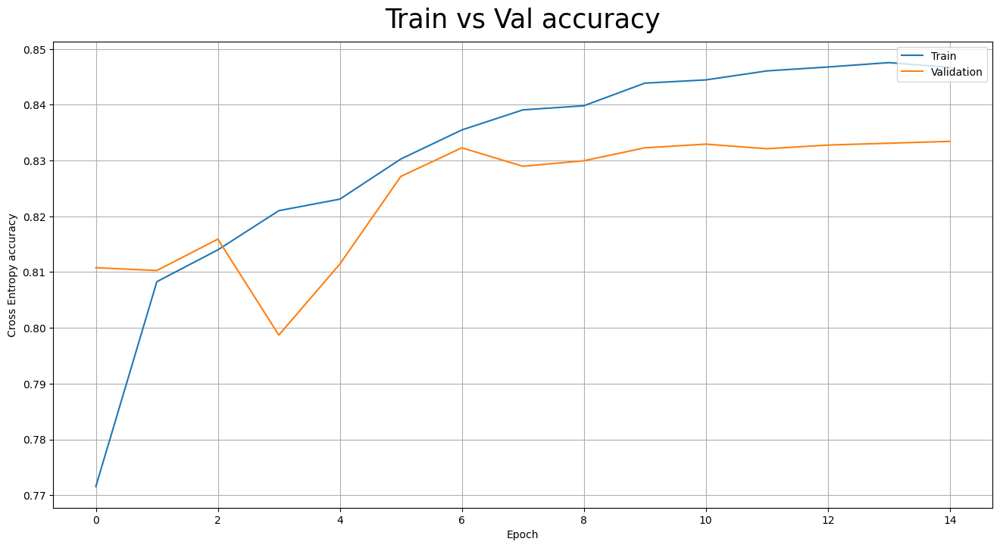

In [ ]:
# 99.76개 -> 92.32
plt.figure(figsize=(16, 8))

plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.ylabel('Cross Entropy Loss')
plt.xlabel('Epoch')
plt.title('Train vs Val Loss', pad=13, fontsize=25)
plt.legend(loc='upper right')
plt.grid(000.1)

plt.show()

plt.figure(figsize=(16, 8))

plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.ylabel('Cross Entropy accuracy')
plt.xlabel('Epoch')
plt.title('Train vs Val accuracy', pad=13, fontsize=25)
plt.legend(loc='upper right')
plt.grid(000.1)

plt.show()

학습이 대체적으로 안정적으로 진행됨이 보입니다. 오버피팅된 부분을 명확히 볼 순 없어 좀더 에폭을 늘린다면 확인할 수 있을 것 같습니다.

### 3. CAM 모델 구성 및 학습

In [ ]:
# fine_tuned model 레이어 재확인
print(base_model.layers[-1].name)  # 출력: activationLayer = pred 확률형성 레이어
print(base_model.layers[-2].name) # outputLayer : 클래스 개수만큼 뉴런수 할당 레이어
print(base_model.layers[-3].name) # dense_1 :
print(base_model.layers[-4].name) # flatten_1
print(base_model.layers[-5].name) # vgg16
print(base_model.layers[-6].name) # AugmentationLayer

activationLayer
outputLayer
dense_1
flatten_1
vgg16
AugmentationLayer


In [ ]:
from tensorflow.keras import layers

# 기존 학습된 모델에서 base_model을 가져옵니다.
base_model = model  # 기존 Fine-Tuned 모델을 그대로 가져옴
base_model.trainable = False  # CAM을 위해 가중치를 고정

# VGG16 서브모델을 가져오기
vgg16_model = base_model.get_layer("vgg16")  # vgg16 레이어 이름

# block5_conv3 레이어를 가져오기
block5_conv3_output = vgg16_model.get_layer("block5_conv3").output

# base_model2_forcheck = VGG16(include_top=False) VGG16 구조 확인
# print(base_model2_forcheck.layers[-1].name)  # 출력: block5_pool
# print(base_model2_forcheck.layers[-2].name) # block5_conv3
# print(base_model2_forcheck.layers[-3].name) # block5_conv2


# Global Average Pooling (GAP)을 추가
new_output = tf.keras.layers.GlobalAveragePooling2D(name="GAP_layer")(block5_conv3_output)
# Dense Layer를 추가하여 최종 CAM 모델을 구성
preds = tf.keras.layers.Dense(num_classes, activation='softmax', name="predictions")(new_output)
# 최종 CAM 모델 생성
cam_model = tf.keras.Model(inputs=vgg16_model.input, outputs=preds, name="CAM_model")

# 모델 구조 출력
cam_model.summary()

Model: "CAM_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, None, None, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, None, None, 64)      │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, None, None, 64)      │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, None, None, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, None, None, 128)     │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, None, None, 128)     │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, None, None, 128)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, None, None, 256)     │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, None, None, 256)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, None, None, 512)     │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, None, None, 512)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ GAP_layer (GlobalAveragePooling2D)   │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ predictions (Dense)                  │ (None, 2)                   │           1,026 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,715,714 (56.14 MB)

 Trainable params: 1,026 (4.01 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

fine tuned model을 base model로 지정하였습니다.  
fine tuned model의 레이어를 확인하여, 최종 끝단의 활성화맵을 지닌 vgg16의 blcok5_conv3를 얻기 위해 layer들의 이름을 활용하였습니다.  
blcok5_conv3 이후 gap layer를 추가한 뒤, pred layer를 추가하여 CAM_model을 완성하였습니다.  
Input Layer는 fine tuned model에서 vgg16 레이어에 들어오는 Input을 그대로 사용했습니다.(Augmentation Layer를 포함)



In [ ]:
def normalize_and_resize_img(image, label):
    # Normalizes images: `uint8` -> `float32`
    image = tf.image.resize(image, [127, 127]) # 영상이미지에 맞춤
    input = tf.cast(image, tf.float32) / 128.
    return image, label
    # input['image'], input['label'] -> 변경 : 해당 데이터셋은 딕셔너리가 아닌 튜플형태로 전달되기 때문!

def apply_normalize_on_dataset(ds, is_test=False, batch_size=16):
    ds = ds.map(                 # normalize_and_resize_img 함수를 데이터셋 ds에 병렬로 적용
        normalize_and_resize_img,
        num_parallel_calls=2
    )
    ds = ds.batch(batch_size) # 배치사이즈 만큼 묶어서 모델에 입력
    '''
    if not is_test:
        ds = ds.repeat()
        ds = ds.shuffle(200)
    '''
    ds = ds.prefetch(tf.data.experimental.AUTOTUNE) # cpu gpu 병렬작업, 적절한 버퍼크기 설정
    return ds

print('슝=3')

슝=3


In [ ]:
# 원본 데이터셋
# y = pd.get_dummies(train_labels["Target"]).values
# random_state = 42
# X_train, X_test, y_train, y_test = train_test_split(train_images, y, test_size=0.2, random_state=random_state)

# 데이터를 tf.data.Dataset으로 변환
train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test))

# 데이터셋에 전처리와 배치처리를 적용합니다.
ds_train_norm = apply_normalize_on_dataset(train_ds)
ds_val_norm = apply_normalize_on_dataset(test_ds)


# 구성된 배치의 모양을 확인해 봅니다.
for input in ds_train_norm.take(1):
    image, label = input
    print(image.shape)
    print(label.shape)

(16, 127, 127, 3)
(16, 2)


노드의 함수들을 그대로 적용시키기 위해, 데이터셋으로 변경 하였습니다.


In [ ]:
train_samples = len(X_train)  # X_train의 길이
test_samples = len(X_test)    # X_test의 길이
print(f'Number of training samples: {train_samples}')
print(f'Number of test samples: {test_samples}')

Number of training samples: 24181
Number of test samples: 6046


In [ ]:
cam_model.compile(optimizer=AdamW(learning_rate=0.00001),
                   loss=losses.categorical_crossentropy,
                   metrics=['accuracy'])

history_cam_model = cam_model.fit(
    ds_train_norm,
    steps_per_epoch=int(train_samples/16),
    validation_steps=int(test_samples/16),
    epochs=5,
    validation_data=ds_val_norm,
    verbose=1,
)

Epoch 1/5
1511/1511 ━━━━━━━━━━━━━━━━━━━━ 51s 29ms/step - accuracy: 0.8032 - loss: 0.4527 - val_accuracy: 0.8148 - val_loss: 0.4236
Epoch 2/5
   1/1511 ━━━━━━━━━━━━━━━━━━━━ 1:13:31 3s/step - accuracy: 0.8000 - loss: 0.3877

/usr/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


1511/1511 ━━━━━━━━━━━━━━━━━━━━ 12s 6ms/step - accuracy: 0.8000 - loss: 0.3877 - val_accuracy: 0.7143 - val_loss: 0.5018
Epoch 3/5
1511/1511 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - accuracy: 0.8333 - loss: 0.4005 - val_accuracy: 0.8239 - val_loss: 0.4031
Epoch 4/5
1511/1511 ━━━━━━━━━━━━━━━━━━━━ 0s 23us/step - accuracy: 0.8000 - loss: 0.3560 - val_accuracy: 0.7143 - val_loss: 0.5203
Epoch 5/5
1511/1511 ━━━━━━━━━━━━━━━━━━━━ 44s 29ms/step - accuracy: 0.8368 - loss: 0.3814 - val_accuracy: 0.8274 - val_loss: 0.3948


* 추가공부
- cam_model에 GAP이후 추가된 Dense layer(pred layer)의 학습이 필요
- 사전에 GAP을 통해 얻은 피쳐맵을 기반으로, 클래스 예측에 적합한 가중치 업데이트



In [ ]:
# cam_model 저장
cam_model_path = '/content/drive/MyDrive/Colab_Notebooks_JD_result/GoingDeeper_CV/12.07_GD3_CAM/cam_model1.h5'
cam_model.save(cam_model_path) # model의 구조, 가중치, 옵티마이저 상태까지 포함해서 저장

print(f"모델이 {cam_model_path}에 성공적으로 저장되었습니다.")

모델이 /content/drive/MyDrive/Colab_Notebooks_JD_result/GoingDeeper_CV/12.07_GD3_CAM/cam_model1.h5에 성공적으로 저장되었습니다.


### 4. 학습된 모델을 바탕으로 CAM 생성

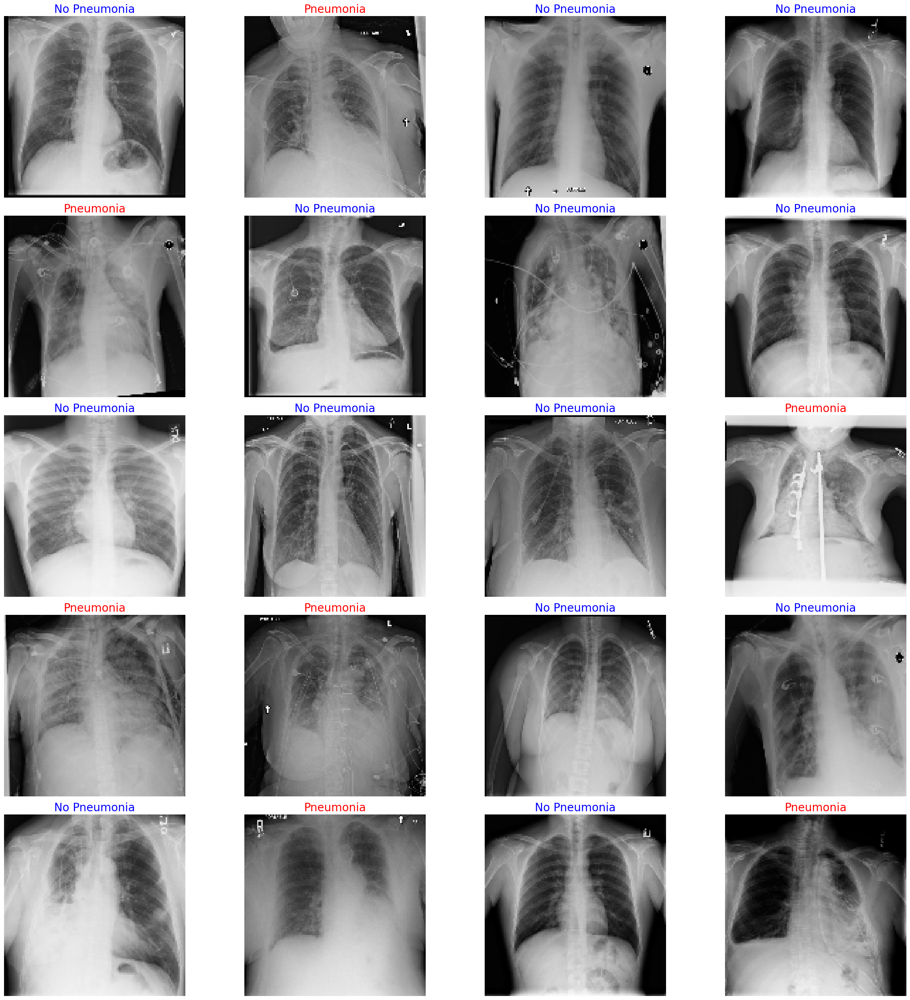

In [ ]:
# 20개의 이미지 비교를 원하기 때문에, 10장의 사진 택 -> for문으로 이미지당 CAM 생성 계획
def get_images_with_labels(dataset, num_images=20):
    images, labels = [], []
    for img, label in dataset.take(num_images):  # num_images만큼 데이터셋에서 가져오기
        images.append(img.numpy())
        labels.append(label.numpy())
    return images, labels

def show_images_with_labels(images, labels, num_images=20):
    plt.figure(figsize=(25, 25))  # 전체 출력 크기 설정

    for i in range(num_images):
        plt.subplot(5, 4, i + 1)  # 2행 5열 레이아웃
        plt.imshow(images[i].astype("uint8"))  # 이미지를 출력

        # 라벨이 원-핫 인코딩된 경우 단일 값으로 변환
        label = np.argmax(labels[i]) if len(labels[i].shape) > 0 else labels[i]
        title = "Pneumonia" if label == 1 else "No Pneumonia"  # 레이블 확인
        color = "red" if label == 1 else "blue"

        plt.title(title, color=color, fontsize=20)  # 레이블 제목 설정
        plt.axis('off')  # 축 제거

    plt.tight_layout()
    plt.show()

# 10개의 이미지와 라벨을 가져옵니다.
images, labels = get_images_with_labels(test_ds, num_images=20)
show_images_with_labels(images, labels)

In [ ]:
import copy
# 위 데이터는 imgae, label 형식으로 되어있기에 Def 수정
def generate_cam(model, item): # 이미 라벨을 포함한 item을 받는 상황 -> 위 모델이 어디를 보는가?를 알기 위함
    item = copy.deepcopy(item)
    width = item['image'].shape[1]
    height = item['image'].shape[0]

    # normalize_and_resize_img 함수 적용 (정규화 및 리사이즈)
    img_tensor, label = normalize_and_resize_img(item['image'], item['label'])
    img_tensor = tf.expand_dims(img_tensor, 0)  # 배치 차원 추가 ()

    # 모델에서 Conv 레이어와 출력층 가져오기
    cam_model = tf.keras.models.Model([model.inputs], [model.layers[-3].output, model.output])
    conv_outputs, predictions = cam_model(img_tensor)
    conv_outputs = conv_outputs[0, :, :, :] # 피쳐맵
    class_idx = np.argmax(label)  # 실제 라벨 값 사용 0(정상), 1(폐렴) -> 원핫인코딩이였던 Label을 정수클래스화

    print(f"Target class (actual label): {class_idx}")
    print(f"Predictions: {predictions[0]}")

    # 모델의 Dense 레이어 가중치 가져오기 -> 클래스 분류에 대한 가중치를 가져오기!
    class_weights = model.layers[-1].get_weights()[0]  # (Conv 채널 수, 클래스 수)

    cam_image = np.zeros(dtype=np.float32, shape=conv_outputs.shape[0:2]) # height,width
    for i, w in enumerate(class_weights[:, class_idx]):
        # class_weights[:, class_idx]: 특정 클래스(class_idx)의 가중치를 가져옵니다.
        # conv_outputs의 i번째 채널과 i번째 weight(w)를 곱해서 누적하면 활성화된 정도(강도 계산)가 나타날 겁니다.
        cam_image += w * conv_outputs[:, :, i]

    cam_image /= np.max(cam_image) # activation score를 normalize합니다. 0~1로 스케일링
    cam_image = cam_image.numpy()
    cam_image = cv2.resize(cam_image, (width, height)) # 원래 이미지의 크기로 resize합니다.
    return cam_image

"""
# 원본 cam 생성 함수
def generate_cam(model, item):
    item = copy.deepcopy(item)
    width = item['image'].shape[1]
    height = item['image'].shape[0]

    img_tensor, class_idx = normalize_and_resize_img(item)

    # 학습한 모델에서 원하는 Layer의 output을 얻기 위해서 모델의 input과 output을 새롭게 정의해줍니다.
    cam_model = tf.keras.models.Model([model.inputs], [model.layers[-3].output, model.output])
    conv_outputs, predictions = cam_model(tf.expand_dims(img_tensor, 0))
    conv_outputs = conv_outputs[0, :, :, :]
    # model.layers[-3].output: 마지막에서 세 번째 레이어(Conv 레이어)의 출력 (dens,pooling 전!=GAP이전 Conv 레이어의 아웃풋)
    # tf.expand_dims(img_tensor, 0): 배치 차원을 추가합니다. 입력 형태는 (1, height, width, channels)가 됩니다.
    # predictions: 모델의 최종 클래스 예측 확률.
    # conv_outputs: Conv 레이어의 출력 Feature Map.


    # 모델의 weight activation은 마지막 layer에 있습니다. CAM 계산 준비
    class_weights = model.layers[-1].get_weights()[0]
    # model.layers[-1]: 최종 Dense 레이어의 가중치를 가져오기


    cam_image = np.zeros(dtype=np.float32, shape=conv_outputs.shape[0:2]) # height,width
    for i, w in enumerate(class_weights[:, class_idx]):
        # class_weights[:, class_idx]: 특정 클래스(class_idx)의 가중치를 가져옵니다.
        # conv_outputs의 i번째 채널과 i번째 weight(w)를 곱해서 누적하면 활성화된 정도(강도 계산)가 나타날 겁니다.
        cam_image += w * conv_outputs[:, :, i]

    cam_image /= np.max(cam_image) # activation score를 normalize합니다. 0~1로 스케일링
    cam_image = cam_image.numpy()
    cam_image = cv2.resize(cam_image, (width, height)) # 원래 이미지의 크기로 resize합니다.
    return cam_image

1. 위코드로 특정 클래스의 활성화 맵(CAM)이 생성
2. CAM은 이미지 내에서 해당 클래스와 관련된 영역 강조
3. 이를 통해 모델이 어떤 부분을 보고 특정 클래스를 예측했는지 확인 가능
"""

"\n# 원 cam 생성 함수\ndef generate_cam(model, item):\n    item = copy.deepcopy(item)\n    width = item['image'].shape[1]\n    height = item['image'].shape[0]\n    \n    img_tensor, class_idx = normalize_and_resize_img(item)\n    \n    # 학습한 모델에서 원하는 Layer의 output을 얻기 위해서 모델의 input과 output을 새롭게 정의해줍니다.\n    cam_model = tf.keras.models.Model([model.inputs], [model.layers[-3].output, model.output])\n    conv_outputs, predictions = cam_model(tf.expand_dims(img_tensor, 0))\n    conv_outputs = conv_outputs[0, :, :, :]\n    # model.layers[-3].output: 마지막에서 세 번째 레이어(Conv 레이어)의 출력 (dens,pooling 전!=GAP이전 Conv 레이어의 아웃풋)\n    # tf.expand_dims(img_tensor, 0): 배치 차원을 추가합니다. 입력 형태는 (1, height, width, channels)가 됩니다.\n    # predictions: 모델의 최종 클래스 예측 확률.\n    # conv_outputs: Conv 레이어의 출력 Feature Map.\n    \n    \n    # 모델의 weight activation은 마지막 layer에 있습니다. CAM 계산 준비\n    class_weights = model.layers[-1].get_weights()[0] \n    # model.layers[-1]: 최종 Dense 레이어의 가중치를 가져오기\n    \n    \n    cam_image = np.ze

Target class (actual label): 0
Predictions: [0.9777819  0.02221814]
Target class (actual label): 1
Predictions: [0.70326287 0.29673716]
Target class (actual label): 0
Predictions: [0.960382   0.03961799]
Target class (actual label): 0
Predictions: [0.9797805  0.02021954]
Target class (actual label): 1
Predictions: [0.2707934 0.7292066]
Target class (actual label): 0
Predictions: [0.7767584  0.22324163]
Target class (actual label): 0
Predictions: [0.38807836 0.61192167]
Target class (actual label): 0
Predictions: [0.9707224  0.02927764]
Target class (actual label): 0
Predictions: [0.93182486 0.06817515]
Target class (actual label): 0
Predictions: [0.76853716 0.23146279]
Target class (actual label): 0
Predictions: [0.59642893 0.4035711 ]
Target class (actual label): 1
Predictions: [0.65465593 0.34534404]
Target class (actual label): 1
Predictions: [0.2370813 0.7629187]
Target class (actual label): 1
Predictions: [0.5096664  0.49033365]
Target class (actual label): 0
Predictions: [0.82952

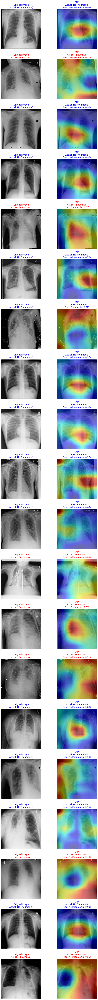

In [ ]:
# 시각화
plt.figure(figsize=(10, 80))  # 전체 그림 크기 설정

for i in range(20):  # 총 20개의 이미지 반복
    item = {'image': images[i], 'label': labels[i]}  # 현재 이미지와 라벨 딕셔너리(사전에 추출한 20개 이미지, 라벨 사용)

    # CAM 생성
    cam_result = generate_cam(cam_model, item)  # 모델과 이미지 데이터로 CAM 생성

    # 라벨 정보 0, 1을 -> Pneumonia로 변경
    class_label = "Pneumonia" if np.argmax(item['label']) == 1 else "No Pneumonia"
    title_color = "red" if class_label == "Pneumonia" else "blue"

    # 모델 예측 확률
    predictions = cam_model(tf.expand_dims(normalize_and_resize_img(item['image'], item['label'])[0], 0))
    pred_class = "Pneumonia" if np.argmax(predictions[0]) == 1 else "No Pneumonia"
    pred_prob = predictions[0][np.argmax(predictions[0])]  # 예측 확률값

    # 원본 이미지
    plt.subplot(20, 2, 2 * i + 1)  #홀수 번째에 원본 이미지
    plt.imshow(item['image'].astype("uint8"))  # 원본 이미지
    plt.title(
        f"Original Image\nActual: {class_label})",
        color=title_color
    )
    plt.axis('off')

    # CAM 덮어씌운 이미지 시각화
    plt.subplot(20, 2, 2 * i + 2)  # 짝수 번째에 CAM 이미지
    plt.imshow(item['image'].astype("uint8"))
    plt.imshow(cam_result, cmap='jet', alpha=0.5)  # CAM 덮어씌우기
    plt.title(
        f"CAM\nActual: {class_label}\nPred: {pred_class} ({pred_prob:.2f})",
        color=title_color
    )
    plt.axis('off')


plt.tight_layout()
plt.show()

- 빨강색 영역이 모델이 해당 영역을 강하게 활성화한 부분입니다.
- cam_model 5에폭 기준, val_accuracy: 0.8274 - val_loss: 0.3948 입니다.


---
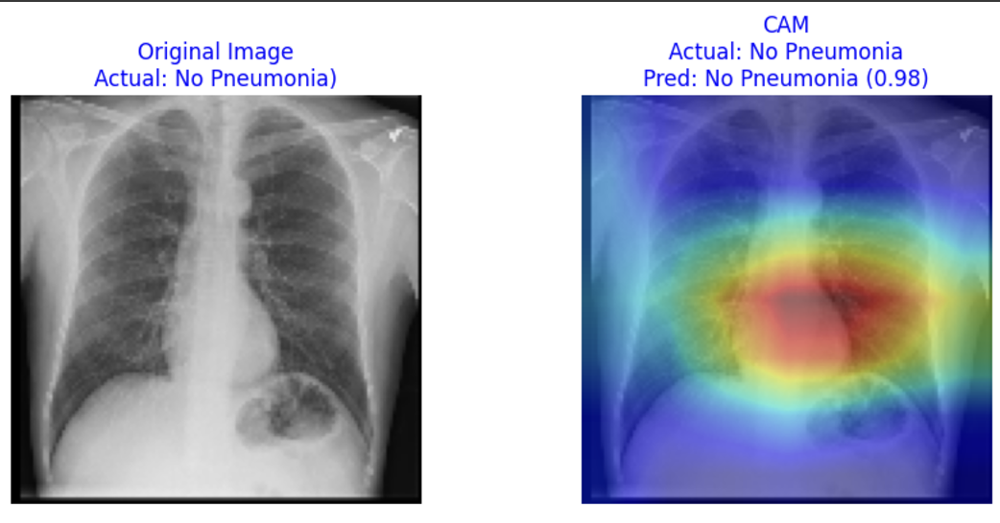
- 위 모델이 class 분류로 예측한 확률값(pred)을 살펴보면, 폐렴이 없는 환자의 영상에 대해 폐렴이 있는 환자의 영상보다 더 높은 확률로 class를 구분짓는다는 것을 확인할 수 있습니다. (pred 0.9 이상의 데이터가 다수 존재)


- 폐렴이 아닌 환자에 대해 위 모델은, 대체로 폐의 중하단부를 바라보고 있음을 확인할 수 있습니다.
- 추가적으로 심장위치를 기준으로 폐의 좌,우 부분을 통해 음영이 덜 하얀부분에 활성화 영역이 강조됨을 확인할 수 있습니다.
    

---

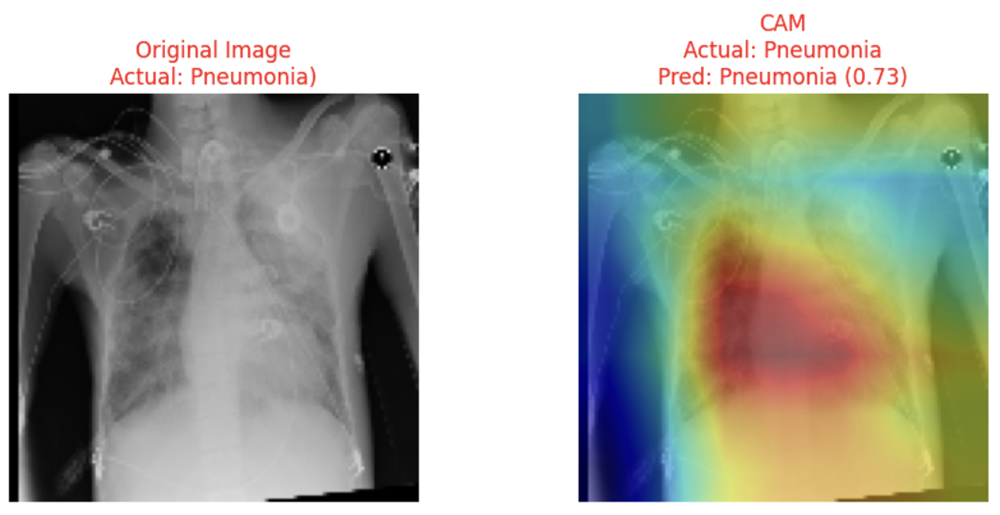
- 반면 폐렴환자를 예측한 확률의 최고값은 0.76으로 정상 환자보다 다소 낮은 확률로 클래스를 구분짓고 있음을 확인할 수 있습니다. 이는 모델의 성능과 연관있다고 생각합니다.
- 폐렴이라고 예측한 영상의 활성화 영역을 살펴보면, 비교적 높은 확률로 예측한 영상에 대해 양 폐의 중심부를 기준으로 넓게 활성화됨을 확인 할 수 있습니다. 이는 폐의 음영이 하얗게 된 병변 부분을 탐지하는 부분이라고 생각했습니다.



---
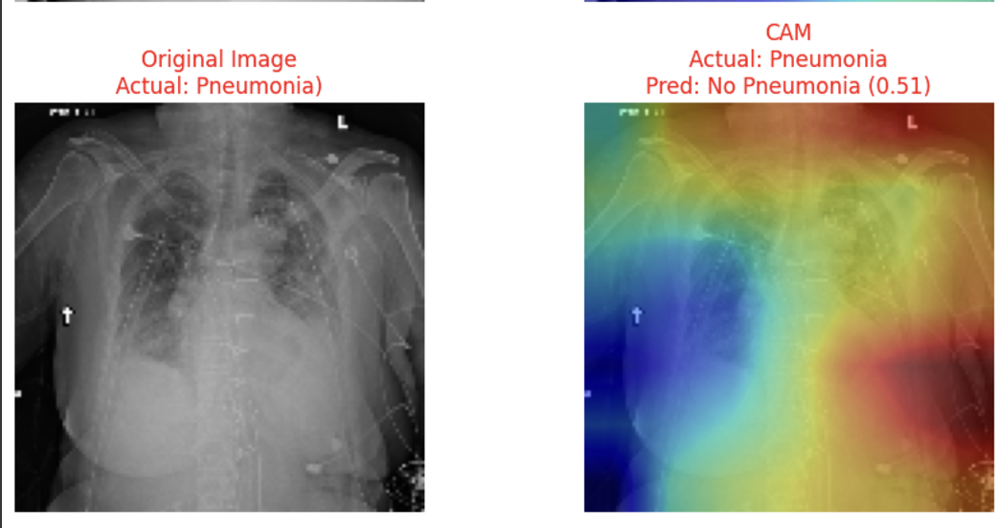
- 하지만 정상 및 폐렴 환자의 다수 영상에서는 폐 위치 자체가 활성화되지 않은 부분이 많았습니다.
- 정상 및 질병과는 전혀 상관이 없는 부분의 활성화영역이 강조된 부분들을 보아, 모델이 잘못된 특징에 주목했을 가능성이 높다고 생각합니다.
- 폐렴은 폐영역이 혼탁해지는 특징을 갖고 있는데, 결국 명확하게 폐렴임을 진단 하기 위해서는 Lung의 Opacitiy를 봐야한다고 생각합니다.
- 추가적으로 위 환자 영상에서 폐렴이 아니지만(Target = 0, Lung opacity가 없는), 다른 질병을 가지고 있는 환자(비정상)의 영상도 있음을 추후 알게됐습니다.  

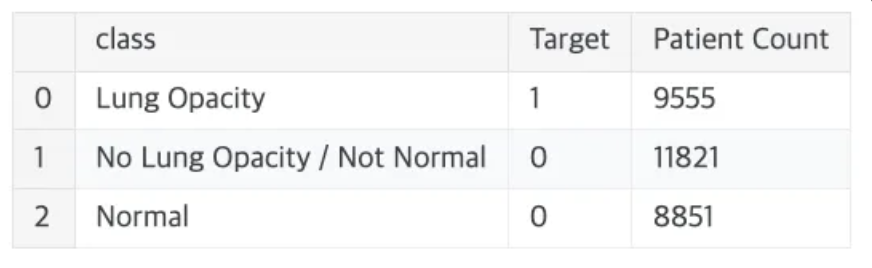
---

- 퍼실님께서 말씀해주신 부분처럼, 폐렴은 정상 폐(공기=검은색=데이터가 없음)에서 일부 영역이 다수 흰색의 패턴으로 채워지는 경향이 있는데 이는 vgg모델의 마지막 활성화 층이 아닌, 좀더 앞단의 활성화층에서 살펴 볼 수 있다고 생각합니다.
- 현재는 고차원의 활성화 영역만을 사용하여 심장, 기관, 횡격막과 같이 기관들을 구분 지을 수 있는 영역을 기준으로 그 주변을 바라보고 있는 것 같습니다.

### 5. Grad_CAM 구현 및 적용


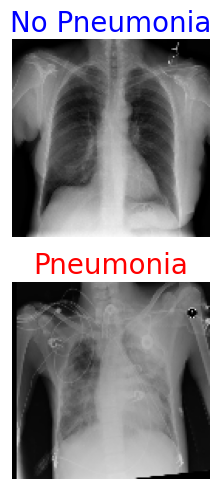

In [110]:
# 20개의 이미지 비교를 원하기 때문에, 10장의 사진 택 -> for문으로 이미지당 CAM 생성 계획
def get_images_with_labels_select(dataset, start_idx=0, num_images=2): # 4,5번 이미지
    images, labels = [], []
    for img, label in dataset.skip(start_idx).take(num_images):  # start_idx만큼 건너뛰고 num_images 가져오기
        images.append(img.numpy())
        labels.append(label.numpy())
    return images, labels

def show_images_with_labels_select(images, labels, num_images=20):
    plt.figure(figsize=(3, 5))  # 전체 출력 크기 설정

    for i in range(len(images)):
        plt.subplot(2, 1, i + 1)  # 2행 1열 레이아웃
        plt.imshow(images[i].astype("uint8"))  # 이미지를 출력

        # 라벨이 원-핫 인코딩된 경우 단일 값으로 변환
        label = np.argmax(labels[i]) if len(labels[i].shape) > 0 else labels[i]
        title = "Pneumonia" if label == 1 else "No Pneumonia"  # 레이블 확인
        color = "red" if label == 1 else "blue"

        plt.title(title, color=color, fontsize=20)  # 레이블 제목 설정
        plt.axis('off')  # 축 제거

    plt.tight_layout()
    plt.show()

# 10개의 이미지와 라벨을 가져옵니다.
images, labels = get_images_with_labels_select(test_ds, start_idx=3, num_images=2)
show_images_with_labels_select(images, labels)

In [ ]:
# model = fintuned model

In [107]:
def generate_grad_cam(model, activation_layer, item):
    item = copy.deepcopy(item)
    width = item['image'].shape[1]
    height = item['image'].shape[0]
    img_tensor, label = normalize_and_resize_img(item['image'], item['label'])

    # Grad cam에서도 cam과 같이 특정 레이어의 output을 필요로 하므로 모델의 input과 output을 새롭게 정의합니다.
    # 이때 원하는 레이어가 다를 수 있으니 해당 레이어의 이름으로 찾은 후 output으로 추가합니다.
    grad_model = tf.keras.models.Model([model.inputs], [model.get_layer(activation_layer).output, model.output])
    class_idx = np.argmax(label)  # 실제 라벨 값 사용 0(정상), 1(폐렴) -> 원핫인코딩이였던 Label을 정수클래스화
    # Model 클래스는 Keras의 Functional API를 사용해 새로운 모델을 정의 = Keras의 Model 클래스는 입력 텐서와 출력 텐서를 기반으로 새로운 모델을 생성
    # activation_layer는 사용자가 Grad-CAM에서 주목하고 싶은 레이어의 이름을 의미
    #	1.	activation_layer의 출력 → 이 레이어의 Feature Map이 필요합니다.
    # 2.	모델의 최종 출력 → 이 값으로부터 **Gradients (기울기)**를 구해야 합니다.


    # Gradient를 얻기 위해 tape를 사용합니다. with 블록 안에 작성된 연산들에 대한 **기울기(gradient)**를 추적
    with tf.GradientTape() as tape:
        conv_output, pred = grad_model(tf.expand_dims(img_tensor, 0)) # pred = model.output = cam모델의 softmax 확률과 동일
        # grad_model의 출력은 Feature Map과 최종 예측값(pred=Softmax 레이어를 거친 클래스별 예측값)입니다.
        loss = pred[:, class_idx] # 원하는 class(여기서는 정답으로 활용) 예측값을 얻습니다.
        output = conv_output[0] # 원하는 layer의 output을 얻습니다.
        grad_val = tape.gradient(loss, conv_output)[0]
        # loss에 대해 conv_output(Feature Map)의 **기울기(gradient)**를 계산
        # 이 기울기는 각 Feature Map 채널이 해당 클래스에 얼마나 기여했는지 나타냄

    weights = np.mean(grad_val, axis=(0, 1)) # gradient의 GAP으로 weight를 구합니다. = 각 채널이 클래스에 기여하는 정도를 나타냅니다
    # axis 0 : 피쳐맵의 높이방향으로 평균, axis 1 : 피쳐맵의 너비방향으로 평균 -> 각 채널별 평균이 계산됨 => 각 채 널에 대해 하나의 평균 기울기값이 나옴
    # 이 값이 해달 채널의 중요도를 나타냄 => gradient가 클수록 해당 채널이 특정 클래스에 더 중요한 역할을 한다는 의미
    # grad_val이 (7,7,512)라면 -> 채널이 512개 -> weight :(512,)가 된다. 각 채널별 평균 기울기 값 => 이 가중치를 각 채널의 피쳐맵에 곱해주면 클래스에 중요한 영역이 강조됨
    grad_cam_image = np.zeros(dtype=np.float32, shape=conv_output.shape[0:2])
    for k, w in enumerate(weights):
        # output의 k번째 채널과 k번째 weight를 곱하고 누적해서 class activation map을 얻습니다.
        grad_cam_image += w * output[:, :, k]
        # 채널별로 중요한 영역이 누적되면서 관심 클래스와 관련된 공간적 영역이 강조

    print(f"Target class (actual label): {class_idx}")
    print(f"Predictions: {pred[0]}")

    grad_cam_image = tf.math.maximum(0, grad_cam_image)
    grad_cam_image /= np.max(grad_cam_image)
    grad_cam_image = grad_cam_image.numpy()
    grad_cam_image = cv2.resize(grad_cam_image, (width, height))
    return grad_cam_image

""" loss = pred[:, class_idx]
    pred = [0.1, 0.9]  # 강아지일 확률: 10%, 고양이일 확률: 90%
	•	class_idx: Grad-CAM이 집중하고 싶은 클래스의 인덱스입니다.
    예를 들어, class_idx = 1이면 고양이에 해당하는 클래스입니다.
	•	pred[:, class_idx]:
	•	원하는 클래스 **class_idx**에 대한 확률값을 의미합니다.
	•	예를 들어:
	•	pred = [0.1, 0.9]이고 class_idx = 1이면 pred[:, class_idx] = 0.9입니다.

    *** 중요
  •	이때 Loss를 해당 클래스의 확률값으로 설정하면:
	•	모델이 예측한 클래스 확률이 높을수록 해당 클래스에 더 잘 예측한 것입니다.
	•	이 확률값에 따른 **Gradient(기울기)**를 계산하면,
        모델이 어떤 Feature Map 채널이 해당 클래스 예측에 중요한 기여를 했는지 알 수 있습니다.
"""

""" output = conv_output[0]
	•	conv_output은 Feature Map이 배치 단위로 반환된 형태입니다.
	•	conv_output[0]을 통해 첫 번째 이미지의 Feature Map만 선택합니다.
	•	예를 들어, conv_output이 (1, 7, 7, 2048)라면 conv_output[0]은 (7, 7, 2048)입니다.
"""

# print('슝=3')

' output = conv_output[0]\n\t•\tconv_output은 Feature Map이 배치 단위로 반환된 형태입니다.\n\t•\tconv_output[0]을 통해 첫 번째 이미지의 Feature Map만 선택합니다.\n\t•\t예를 들어, conv_output이 (1, 7, 7, 2048)라면 conv_output[0]은 (7, 7, 2048)입니다.\n'

In [108]:
# 시각화 함수
def visualize_multiple_grad_cams(model, images, labels, layer_names):
    """
    여러 레이어에 대해 Grad-CAM을 계산하고 시각화합니다.
    model: 모델
    images: 이미지 리스트
    labels: 라벨 리스트
    layer_names: 활성화 맵을 보고 싶은 레이어 이름 리스트
    """
    num_layers = len(layer_names)
    num_images = len(images)

    plt.figure(figsize=(15, num_images * 2))

    for img_idx in range(num_images):  # 각 이미지에 대해 반복
        item = {'image': images[img_idx], 'label': labels[img_idx]}

        for layer_idx, layer_name in enumerate(layer_names):  # 각 레이어에 대해 반복
            grad_cam_image = generate_grad_cam(model, layer_name, item)

            plt.subplot(num_images, num_layers, img_idx * num_layers + layer_idx + 1)
            plt.imshow(item['image'].astype("uint8"))
            plt.imshow(grad_cam_image, cmap='jet', alpha=0.5)  # Grad-CAM 덮어씌우기
            plt.title(f"{layer_name}\nLabel: {np.argmax(item['label'])}")
            plt.axis('off')

    plt.tight_layout()
    plt.show()

# Grad-CAM 시각화 실행
layer_names = [
    "block1_conv2",  # VGG16 기준 Conv 레이어 이름 (사용 중인 모델에 맞게 변경)
    "block2_conv2",
    "block3_conv3",
    "block4_conv3",
    "block5_conv3"
]

Target class (actual label): 0
Predictions: [0.9797805  0.02021954]
Target class (actual label): 0
Predictions: [0.9797805  0.02021954]
Target class (actual label): 0
Predictions: [0.9797805  0.02021954]
Target class (actual label): 0
Predictions: [0.9797805  0.02021954]
Target class (actual label): 0
Predictions: [0.9797805  0.02021954]
Target class (actual label): 1
Predictions: [0.2707934 0.7292066]
Target class (actual label): 1
Predictions: [0.2707934 0.7292066]
Target class (actual label): 1
Predictions: [0.2707934 0.7292066]
Target class (actual label): 1
Predictions: [0.2707934 0.7292066]
Target class (actual label): 1
Predictions: [0.2707934 0.7292066]


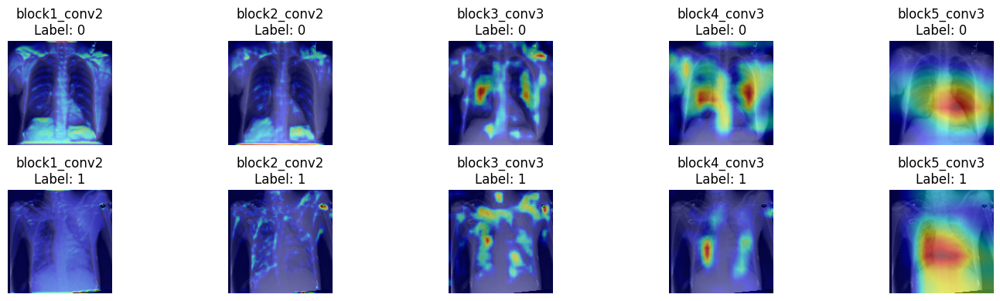

In [112]:
# 이미지 및 라벨 준비
images, labels = get_images_with_labels_select(test_ds, start_idx=3, num_images=2)  # 예시로 2개의 이미지
visualize_multiple_grad_cams(cam_model, images, labels, layer_names)

- block4_conv2, block3_conv2가 가장 폐의 영역을 바라보는 것 같습니다.
- 모델 자체를 새롭게 만들고 성능을 개선시켜본다면?
- block3 or block4까지만 활용하여, 파인튜닝을 통해 모델 성능을 개선해 볼수 있지 않을까..?



### 6. CAM vs Grad CAM blcok5_conv3기준 성능비교

Target class (actual label): 0
Predictions: [0.9797805  0.02021954]
Target class (actual label): 0
Predictions: [0.9797805  0.02021954]


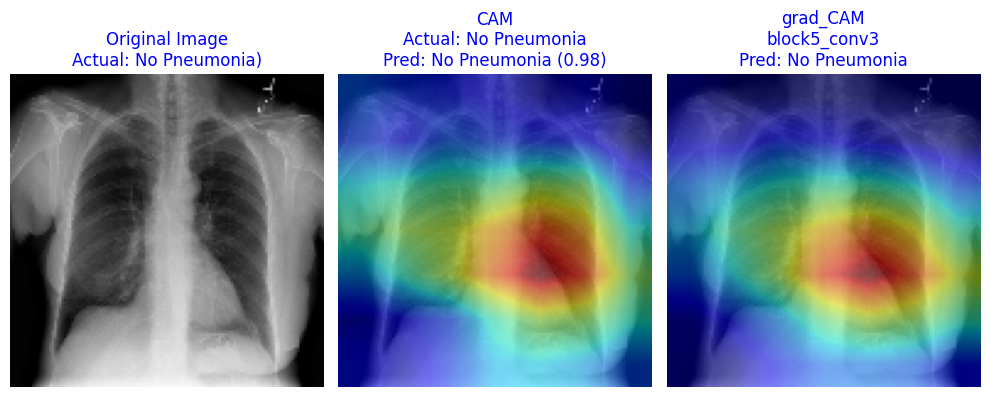

In [124]:
images, labels = get_images_with_labels_select(test_ds, start_idx=3, num_images=2)
plt.figure(figsize=(10, 10))  # 전체 그림 크기 설정
item = {'image': images[0], 'label': labels[0]}  # 현재 이미지와 라벨 딕셔너리(사전에 추출한 20개 이미지, 라벨 사용)

    # CAM 생성
cam_result = generate_cam(cam_model, item)  # 모델과 이미지 데이터로 CAM 생성

    # 라벨 정보 0, 1을 -> Pneumonia로 변경
class_label = "Pneumonia" if np.argmax(item['label']) == 1 else "No Pneumonia"
title_color = "red" if class_label == "Pneumonia" else "blue"

    # 모델 예측 확률
predictions = cam_model(tf.expand_dims(normalize_and_resize_img(item['image'], item['label'])[0], 0))
pred_class = "Pneumonia" if np.argmax(predictions[0]) == 1 else "No Pneumonia"
pred_prob = predictions[0][np.argmax(predictions[0])]  # 예측 확률값

    # 원본 이미지
plt.subplot(1, 3, 1)  #홀수 번째에 원본 이미지
plt.imshow(item['image'].astype("uint8"))  # 원본 이미지
plt.title(
    f"Original Image\nActual: {class_label})",
    color=title_color
)
plt.axis('off')

# CAM 덮어씌운 이미지 시각화
plt.subplot(1, 3, 2)  # 짝수 번째에 CAM 이미지
plt.imshow(item['image'].astype("uint8"))
plt.imshow(cam_result, cmap='jet', alpha=0.5)  # CAM 덮어씌우기
plt.title(
    f"CAM\nActual: {class_label}\nPred: {pred_class} ({pred_prob:.2f})",
    color=title_color
)
plt.axis('off')

layer_names = "block5_conv3"
    # item = {'image': images[i], 'label': labels[i]}
grad_cam_image = generate_grad_cam(cam_model, layer_names, item)

plt.subplot(1,3,3)
plt.imshow(item['image'].astype("uint8"))
plt.imshow(grad_cam_image, cmap='jet', alpha=0.5)  # Grad-CAM 덮어씌우기
plt.title(f"grad_CAM\n{layer_names}\nPred: {pred_class}", color=title_color)
plt.axis('off')

plt.tight_layout()
plt.show()

정성적 비교
- CAM과 grad_CAM의 활성화 영역을 볼 때, grad_CAM이 좀더 class구분에 유의미한 영역을 활성화 하는 것처럼 보입니다.   
좌측 CAM의 경우 영상의 오른팔(사진상 좌측) 부위가 일정 값이 상 활성화 되는것이 관찰 됩니다. 하지만 grad_CAM의 경우는 덜 활성화 되어있음이 보입니다.

Target class (actual label): 1
Predictions: [0.2707934 0.7292066]
Target class (actual label): 1
Predictions: [0.2707934 0.7292066]


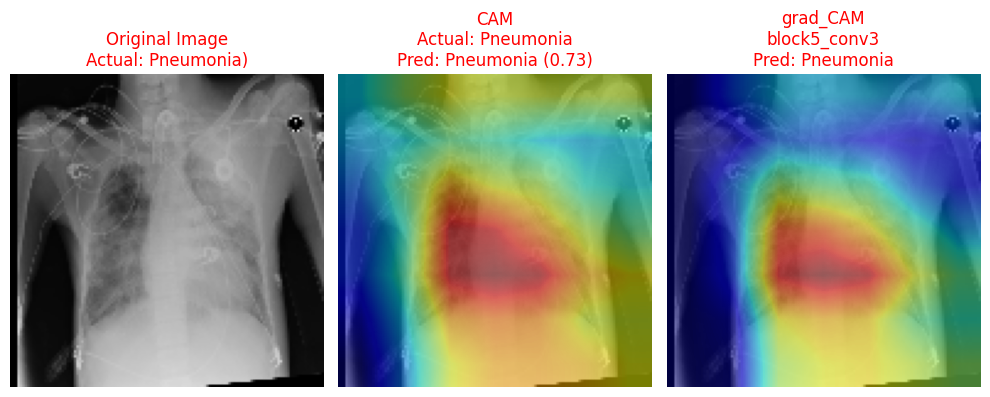

In [125]:
images, labels = get_images_with_labels_select(test_ds, start_idx=3, num_images=2)
plt.figure(figsize=(10, 10))  # 전체 그림 크기 설정
item = {'image': images[1], 'label': labels[1]}  # 현재 이미지와 라벨 딕셔너리(사전에 추출한 20개 이미지, 라벨 사용)

    # CAM 생성
cam_result = generate_cam(cam_model, item)  # 모델과 이미지 데이터로 CAM 생성

    # 라벨 정보 0, 1을 -> Pneumonia로 변경
class_label = "Pneumonia" if np.argmax(item['label']) == 1 else "No Pneumonia"
title_color = "red" if class_label == "Pneumonia" else "blue"

    # 모델 예측 확률
predictions = cam_model(tf.expand_dims(normalize_and_resize_img(item['image'], item['label'])[0], 0))
pred_class = "Pneumonia" if np.argmax(predictions[0]) == 1 else "No Pneumonia"
pred_prob = predictions[0][np.argmax(predictions[0])]  # 예측 확률값

    # 원본 이미지
plt.subplot(1, 3, 1)  #홀수 번째에 원본 이미지
plt.imshow(item['image'].astype("uint8"))  # 원본 이미지
plt.title(
    f"Original Image\nActual: {class_label})",
    color=title_color
)
plt.axis('off')

# CAM 덮어씌운 이미지 시각화
plt.subplot(1, 3, 2)  # 짝수 번째에 CAM 이미지
plt.imshow(item['image'].astype("uint8"))
plt.imshow(cam_result, cmap='jet', alpha=0.5)  # CAM 덮어씌우기
plt.title(
    f"CAM\nActual: {class_label}\nPred: {pred_class} ({pred_prob:.2f})",
    color=title_color
)
plt.axis('off')

layer_names = "block5_conv3"
    # item = {'image': images[i], 'label': labels[i]}
grad_cam_image = generate_grad_cam(cam_model, layer_names, item)

plt.subplot(1,3,3)
plt.imshow(item['image'].astype("uint8"))
plt.imshow(grad_cam_image, cmap='jet', alpha=0.5)  # Grad-CAM 덮어씌우기
plt.title(f"grad_CAM\n{layer_names}\nPred: {pred_class}", color=title_color)
plt.axis('off')

plt.tight_layout()
plt.show()

정성적 비교
- 폐렴환자에 대한 활성화 영역을 비교해 볼때, 정상인 영상을 비교했을때 보다 더욱 grad_CAM이 클래스 구분에 좀더 명확한 영역을 활성화 함이 보입니다.
- CAM의 경우, GAP(Global Average Pooling)을 통과한 feature map을 기반으로 클래스별 활성화 영역을 생성합니다.  
반면 Gradinet CAM은 최종 featrue map에 대한 gradient를 사용해, 피쳐맵 채널별 기여도를 가중 평균한 활성화 맵을 생성합니다. CAM은 단순 conv layer의 weight만 활용하지만, Grad CAM은 Gradient를 활용해 좀 더 세밀하게 활성화 영역을 강조한다고 생각합니다.



### 7. Bounding Box, IOU 계산

In [202]:
# 위 두개의 이미지 그대로 사용
# (CAM) 이미지에서 Bounding Box(경계 상자)를 추출하는 함수
# CAM 이미지에서 특정 클래스가 활성화된 영역을 기준으로 경계 상자를 찾아 반환
def get_bbox(cam_image, score_thresh=0.05):
    # cam_image: CAM 이미지, 값이 0과 1 사이의 활성화 점수를 가진 이미지 threshold 0.05(낮은 활성화) 미만 무시
    cam_image_copy = np.copy(cam_image)
    low_indicies = cam_image_copy <= score_thresh
    # low_indicies: cam_image에서 점수가 score_thresh 이하인 픽셀들의 위치(Boolean 배열)

    cam_image_copy[low_indicies] = 0
    cam_image_copy = (cam_image_copy*255).astype(np.uint8)

    contours,_ = cv2.findContours(cam_image_copy, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours[0]
    # 검출된 첫 번째 Contour를 선택 -> 첫번째 contour가 가장 큰 활성화 영역임
    rotated_rect = cv2.minAreaRect(cnt) # 주어진 contour 감싸는 가장 작은 회전된 사각형
    rect = cv2.boxPoints(rotated_rect) # 곡지점 구하기 4개 좌표
    rect = np.int0(rect) # 정수형 변환
    return rect # 좌표 4개 반환
"""
	•	cv2.findContours: 이미지에서 **Contour(경계선)**를 찾아주는 OpenCV 함수입니다.
	•	cv2.RETR_TREE: 계층적 구조로 모든 Contour를 찾아냅니다.
	•	cv2.CHAIN_APPROX_SIMPLE: Contour를 간소화해 꼭지점만 반환합니다.
	•	contours: 검출된 Contour들의 리스트입니다. 활성화 영역의 경계선입니다.
	•	_: 계층 구조를 나타내지만 여기서는 사용하지 않으므로 _로 무시합니다.
"""
print('슝=3')

슝=3


In [215]:
# 원본 이미지 카피
item0 = {'image': images[0], 'label': labels[0]}  # 현재 이미지와 라벨 딕셔너리(사전에 추출한 20개 이미지, 라벨 사용)
image0 = copy.deepcopy(item0['image'])
cam_result0 = generate_cam(cam_model, item0)  # 모델과 이미지 데이터로 CAM 생성
grad_cam_image0 = generate_grad_cam(cam_model, layer_names, item0)

item1 = {'image': images[1], 'label': labels[1]}  # 현재 이미지와 라벨 딕셔너리(사전에 추출한 20개 이미지, 라벨 사용)
image1 = copy.deepcopy(item1['image'])
cam_result1 = generate_cam(cam_model, item1)  # 모델과 이미지 데이터로 CAM 생성
grad_cam_image1 = generate_grad_cam(cam_model, layer_names, item1)

rect0 = get_bbox(cam_result0)
rect_grad0 = get_bbox(grad_cam_image0)
rect1 = get_bbox(cam_result1)
rect_grad1 = get_bbox(grad_cam_image1)

Target class (actual label): 0
Predictions: [0.9797805  0.02021954]
Target class (actual label): 0
Predictions: [0.9797805  0.02021954]
Target class (actual label): 1
Predictions: [0.2707934 0.7292066]
Target class (actual label): 1
Predictions: [0.2707934 0.7292066]


<ipython-input-202-1a60ce68335c>:18: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect) # 정수형 변환


In [205]:
image3_cam = cv2.drawContours(image0, [rect], 0, (0,0,255), 2)
image3_gradcam = cv2.drawContours(image0, [rect_grad], 0, (0,0,255), 2)
image4_cam = cv2.drawContours(image1, [rect], 0, (0,0,255), 2)
image4_gradcam = cv2.drawContours(image1, [rect_grad], 0, (0,0,255), 2)

#### 실험1. thershold 0.05

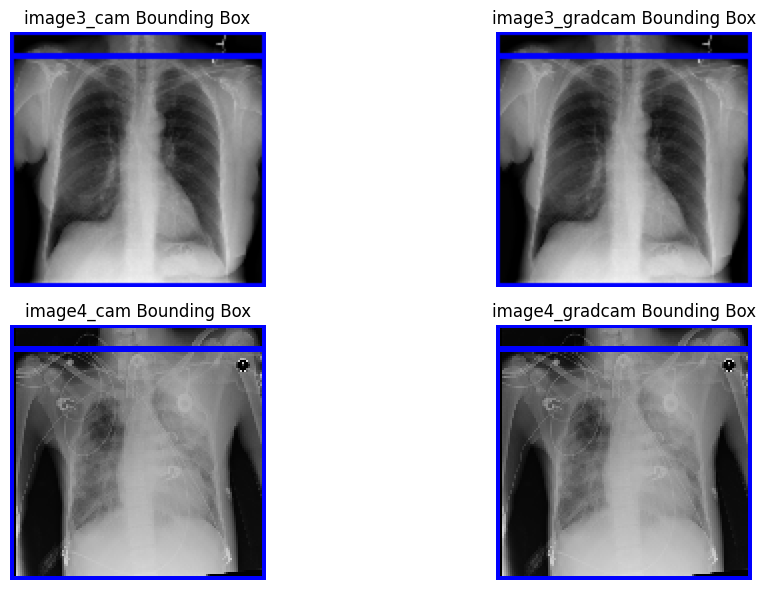

In [206]:
# thershold 0.05
# 시각화
plt.figure(figsize=(12, 6))

# 3번 영상 CAM 이미지 시각화
plt.subplot(2, 2, 1)
plt.imshow(image3_cam.astype("uint8"))
plt.title("image3_cam Bounding Box", fontsize=12)
plt.axis('off')

# 3번 영상 Grad-CAM 이미지 시각화
plt.subplot(2, 2, 2)
plt.imshow(image3_gradcam.astype("uint8"))
plt.title("image3_gradcam Bounding Box", fontsize=12)
plt.axis('off')

# 4번 영상 CAM 이미지 시각화
plt.subplot(2, 2, 3)
plt.imshow(image4_cam.astype("uint8"))
plt.title("image4_cam Bounding Box", fontsize=12)
plt.axis('off')

# 4번 영상 Grad-CAM 이미지 시각화
plt.subplot(2, 2, 4)
plt.imshow(image4_gradcam.astype("uint8"))
plt.title("image4_gradcam Bounding Box", fontsize=12)
plt.axis('off')


plt.tight_layout()
plt.show()

- 낮은 threshold는 유의미한 bbox를 생성하지 않았습니다.

#### 실험2. thershold 0.5

In [212]:
def get_bbox2(cam_image, score_thresh=0.5):
    # CAM 이미지 복사본 생성 (원본 손상 방지)
    cam_image_copy = np.copy(cam_image)

    # 활성화 점수 threshold 이하 제거
    low_indices = cam_image_copy <= score_thresh
    cam_image_copy[low_indices] = 0
    cam_image_copy = (cam_image_copy * 255).astype(np.uint8)

    # Contour 검출
    contours, _ = cv2.findContours(cam_image_copy, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:  # Contour가 없으면 None 반환
        return None

    # 가장 큰 Contour 선택 (면적 기준)
    largest_contour = max(contours, key=cv2.contourArea)

    # Contour를 감싸는 최소 회전 사각형
    rotated_rect = cv2.minAreaRect(largest_contour)
    rect = cv2.boxPoints(rotated_rect)
    rect = np.int0(rect)  # 정수형 변환
    return rect

<ipython-input-212-095cb65c2654>:22: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)  # 정수형 변환


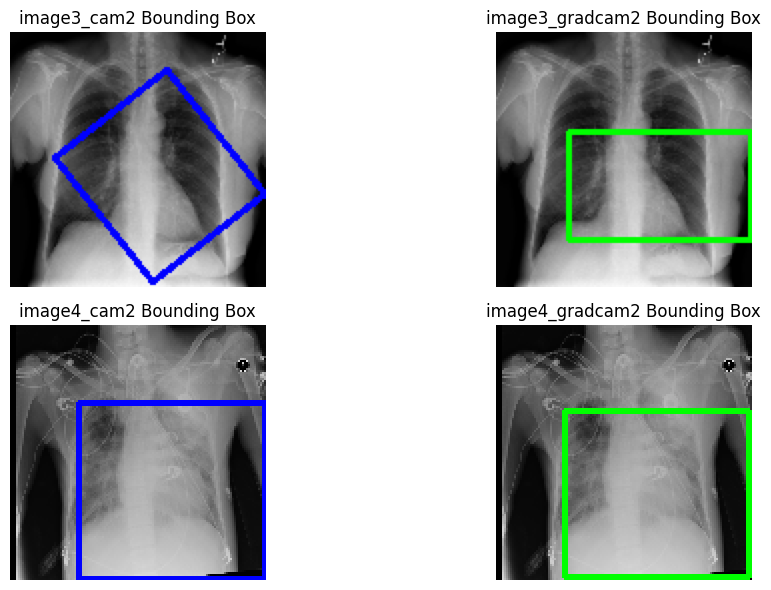

In [216]:
rect0_2 = get_bbox2(cam_result0)
rect_grad0_2 = get_bbox2(grad_cam_image0)
rect1_2 = get_bbox2(cam_result1)
rect_grad1_2 = get_bbox2(grad_cam_image1)


# 이미지 복사본 생성 (원본 손상 방지)
image3_cam2 = np.copy(images[0])
image3_gradcam2 = np.copy(images[0])
image4_cam2 = np.copy(images[1])
image4_gradcam2 = np.copy(images[1])

image3_cam2 = cv2.drawContours(image3_cam2, [rect0_2], 0, (0, 0, 255), 2)
image4_cam2 = cv2.drawContours(image4_cam2, [rect1_2], 0, (0, 0, 255), 2)
image3_gradcam2 = cv2.drawContours(image3_gradcam2, [rect_grad0_2], 0, (0, 255, 0), 2)  # 초록색으로 표시
image4_gradcam2 = cv2.drawContours(image4_gradcam2, [rect_grad1_2], 0, (0, 255, 0), 2)

# thershold 0.5
# 시각화
plt.figure(figsize=(12, 6))

# 3번 영상 CAM 이미지 시각화
plt.subplot(2, 2, 1)
plt.imshow(image3_cam2.astype("uint8"))
plt.title("image3_cam2 Bounding Box", fontsize=12)
plt.axis('off')

# 3번 영상 Grad-CAM 이미지 시각화
plt.subplot(2, 2, 2)
plt.imshow(image3_gradcam2.astype("uint8"))
plt.title("image3_gradcam2 Bounding Box", fontsize=12)
plt.axis('off')

# 4번 영상 CAM 이미지 시각화
plt.subplot(2, 2, 3)
plt.imshow(image4_cam2.astype("uint8"))
plt.title("image4_cam2 Bounding Box", fontsize=12)
plt.axis('off')

# 4번 영상 Grad-CAM 이미지 시각화
plt.subplot(2, 2, 4)
plt.imshow(image4_gradcam2.astype("uint8"))
plt.title("image4_gradcam2 Bounding Box", fontsize=12)
plt.axis('off')


plt.tight_layout()
plt.show()

- Thershold를 증가시킨 결과, 바운딩 박스가 유의미하게 잡힌것을 확인하였습니다.
- cam은 돌아간 사각형 영역을, Gradcam은 우측중앙을 기준으로 바운딩 박스가 잡혔습니다.
- 위 threshold를 기준으로 하였을땐, CAM이 어느 영상이건, 폐의 전반적인 부분을 강조하여 관찰할 수 있음을 확인할 수 있습니다.


### 실험3 threshold = 0.7

<ipython-input-217-a02b5a4f7f60>:22: DeprecationWarning: `np.int0` is a deprecated alias for `np.intp`.  (Deprecated NumPy 1.24)
  rect = np.int0(rect)  # 정수형 변환


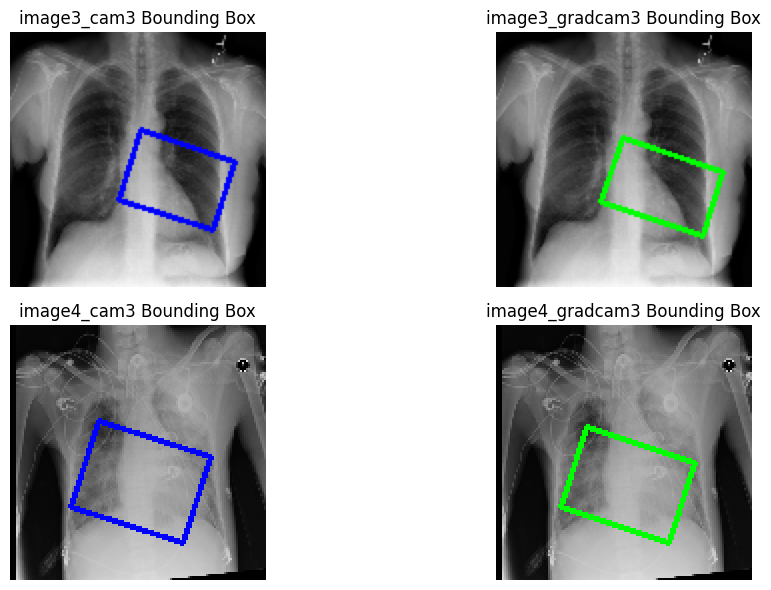

In [217]:
def get_bbox3(cam_image, score_thresh=0.7):
    # CAM 이미지 복사본 생성 (원본 손상 방지)
    cam_image_copy = np.copy(cam_image)

    # 활성화 점수 threshold 이하 제거
    low_indices = cam_image_copy <= score_thresh
    cam_image_copy[low_indices] = 0
    cam_image_copy = (cam_image_copy * 255).astype(np.uint8)

    # Contour 검출
    contours, _ = cv2.findContours(cam_image_copy, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    if not contours:  # Contour가 없으면 None 반환
        return None

    # 가장 큰 Contour 선택 (면적 기준)
    largest_contour = max(contours, key=cv2.contourArea)

    # Contour를 감싸는 최소 회전 사각형
    rotated_rect = cv2.minAreaRect(largest_contour)
    rect = cv2.boxPoints(rotated_rect)
    rect = np.int0(rect)  # 정수형 변환
    return rect


rect0_3 = get_bbox3(cam_result0)
rect_grad0_3 = get_bbox3(grad_cam_image0)
rect1_3 = get_bbox3(cam_result1)
rect_grad1_3 = get_bbox3(grad_cam_image1)


# 이미지 복사본 생성 (원본 손상 방지)
image3_cam3 = np.copy(images[0])
image3_gradcam3 = np.copy(images[0])
image4_cam3 = np.copy(images[1])
image4_gradcam3 = np.copy(images[1])

image3_cam3 = cv2.drawContours(image3_cam3, [rect0_3], 0, (0, 0, 255), 2)
image4_cam3 = cv2.drawContours(image4_cam3, [rect1_3], 0, (0, 0, 255), 2)
image3_gradcam3 = cv2.drawContours(image3_gradcam3, [rect_grad0_3], 0, (0, 255, 0), 2)  # 초록색으로 표시
image4_gradcam3 = cv2.drawContours(image4_gradcam3, [rect_grad1_3], 0, (0, 255, 0), 2)

# thershold 0.5
# 시각화
plt.figure(figsize=(12, 6))

# 3번 영상 CAM 이미지 시각화
plt.subplot(2, 2, 1)
plt.imshow(image3_cam3.astype("uint8"))
plt.title("image3_cam3 Bounding Box", fontsize=12)
plt.axis('off')

# 3번 영상 Grad-CAM 이미지 시각화
plt.subplot(2, 2, 2)
plt.imshow(image3_gradcam3.astype("uint8"))
plt.title("image3_gradcam3 Bounding Box", fontsize=12)
plt.axis('off')

# 4번 영상 CAM 이미지 시각화
plt.subplot(2, 2, 3)
plt.imshow(image4_cam3.astype("uint8"))
plt.title("image4_cam3 Bounding Box", fontsize=12)
plt.axis('off')

# 4번 영상 Grad-CAM 이미지 시각화
plt.subplot(2, 2, 4)
plt.imshow(image4_gradcam3.astype("uint8"))
plt.title("image4_gradcam3 Bounding Box", fontsize=12)
plt.axis('off')


plt.tight_layout()
plt.show()

- 하단 CAM, grad_CAM 활성화 영역을 참고하여 비교할 수 있습니다.
- threshold 0.3~0.4 의 값이 가장 적절하지 않을까 추정해봅니다.

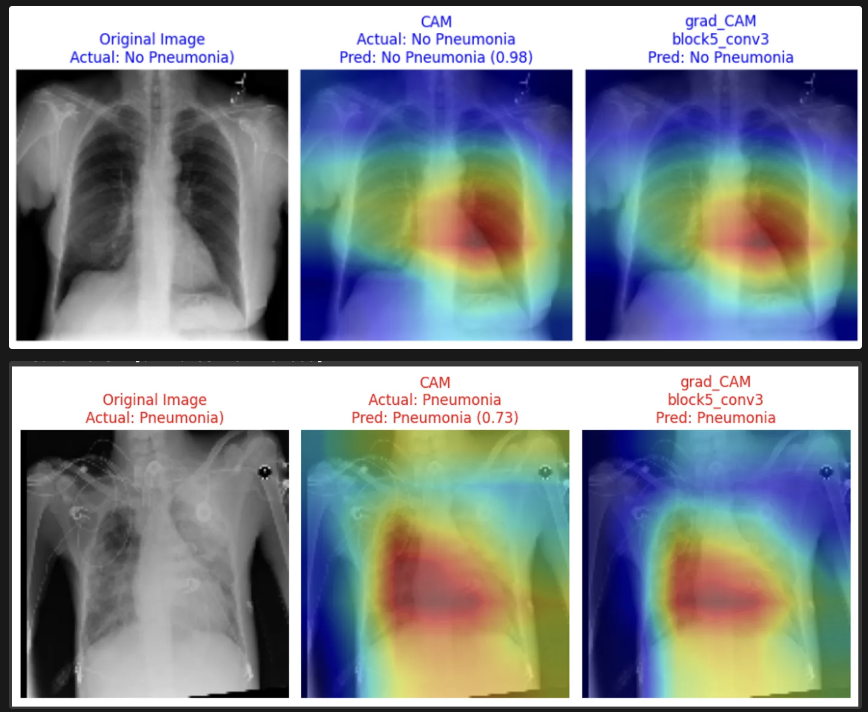

### 8. 회고
배운 것을 응용해보고 싶어, 관심분야에 관련된 데이터를 찾고 이를 적용해보았습니다.
데이터 수집, 로드, 전처리에 시간이 오래 걸렸지만 그 과정 자체가 흥미롭고 재밌었습니다.  
데이터 탐색을 미비하게 하여, 이후 IOU계산을 진행하지 못한점이 아쉽습니다. 추후 시간이 될때, 데이터 탐색부터 다시금 진행해보고 싶습니다.  
CAM과 grad_CAM을 통해 모델의 설명가능성에 대한 부분을 공부할 수 있어서 좋았던 학습 시간이었습니다. 특히 grad_cam을 통한 저차원에서 고차원의 데이터 특징들이 강조된 활성화 맵을 보며서, 원하는 피쳐맵에 대한 위치를 파악할 수 있던 점도 흥미로웠습니다.

